# 1. Libraries

In [43]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import datetime

# 2. Load data

In [44]:
df_nivel = pd.read_csv('/home/nivelrios/documentos/Mburicao Project/data/processed/nivel_processed.csv')
df_picos = pd.read_csv('/home/nivelrios/documentos/Mburicao Project/data/external/peak_detection_info.csv')

# 3. Plotting

## 3.1 Overview

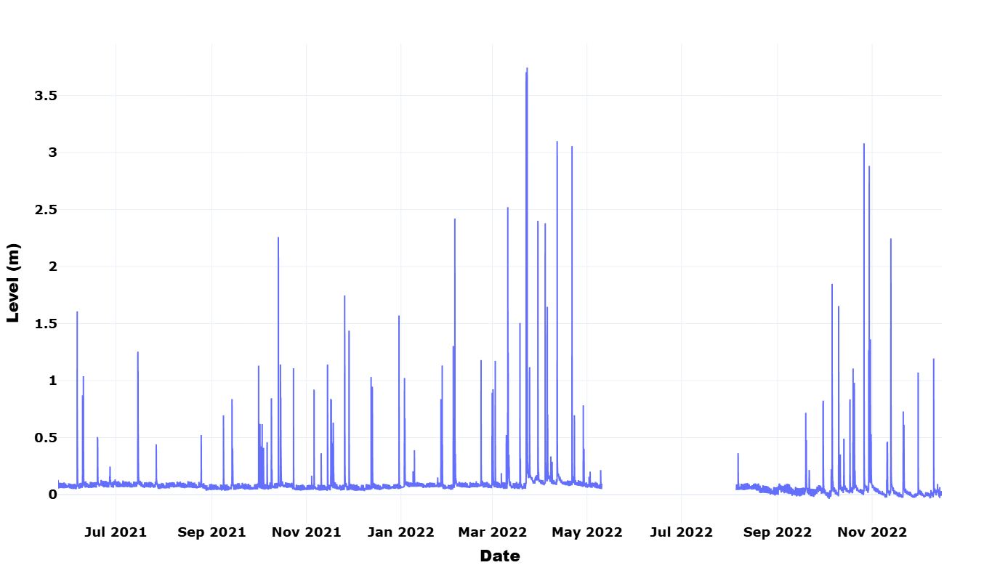

In [45]:
fig = px.line(
    df_nivel,
    x="fecha",               
    y="nivel",                
    labels={'fecha': 'Date', 'nivel': 'Level (m)'}, 
    template='plotly_white'
)

fig.update_traces(
    marker=dict(
        color='blue',            
        line=dict(
            color='darkblue',    
            width=1.5               
        )
    )
)

fig.update_layout(
    title_font=dict(size=20, color='black', family='Arial'),
    xaxis=dict(
        title='Date',
        title_font=dict(size=22, color='black', family='Arial Black'),  
        tickfont=dict(size=18, color='black',weight="bold")
    ),
    yaxis=dict(
        title='Level (m)',
        title_font=dict(size=22, color='black', family='Arial Black'),  
        tickfont=dict(size=18, color='black',weight="bold")
    ),
    autosize=False,
    width=1600,  # Aumentado para mejorar resolución (manteniendo relación 4:3) tickfont=dict(size=16, color="black",weight="bold")
    height=800
)

fig.show()



## 3.2 Zoom selection

In [46]:
def pedir_fecha(mensaje):
    print(mensaje)
    year = int(input("Año: "))
    month = int(input("Mes: "))
    day = int(input("Día: "))
    hour = int(input("Hora: "))
    minute = int(input("Minuto: "))
    second = int(input("Segundo: "))
    return datetime.datetime(year, month, day, hour, minute, second)

Ingresa la fecha de INICIO:


Año:  2021
Mes:  9
Día:  1
Hora:  12
Minuto:  0
Segundo:  0


Ingresa la fecha de FIN:


Año:  2021
Mes:  9
Día:  28
Hora:  12
Minuto:  0
Segundo:  0


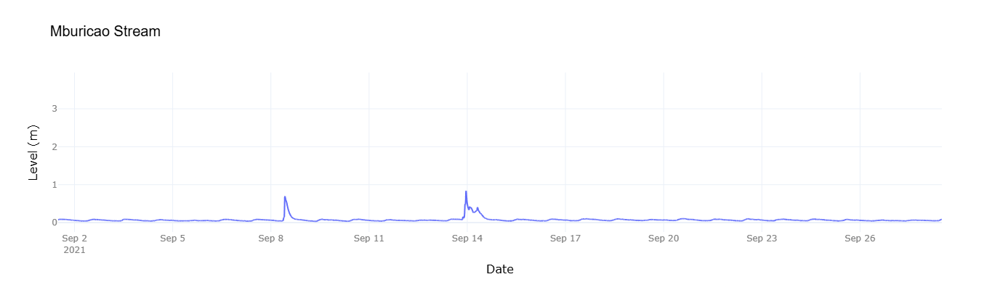

In [38]:
start_date = pedir_fecha("Ingresa la fecha de INICIO:")
end_date = pedir_fecha("Ingresa la fecha de FIN:")

fig = px.line(
    df_nivel,
    x="fecha",               
    y="nivel",                
    labels={'fecha': 'Date', 'nivel': 'Level (m)'}, 
    title='Mburicao Stream',
    template='plotly_white'
)

fig.update_traces(
    marker=dict(
        color='blue',            
        line=dict(
            color='darkblue',    
            width=1.5               
        )
    )
)

fig.update_layout(
    title_font=dict(size=20, color='black', family='Arial'),
    xaxis=dict(
        title='Date',
        title_font=dict(size=16, color='black'),
        tickfont=dict(size=12, color='gray')
    ),
    yaxis=dict(
        title='Level (m)',
        title_font=dict(size=16, color='black'),
        tickfont=dict(size=12, color='gray')
    ),
    autosize=False,
    width=800,
    height=400
)

fig.update_xaxes(range=[start_date, end_date])

fig.show()

## 3.3 Peaks

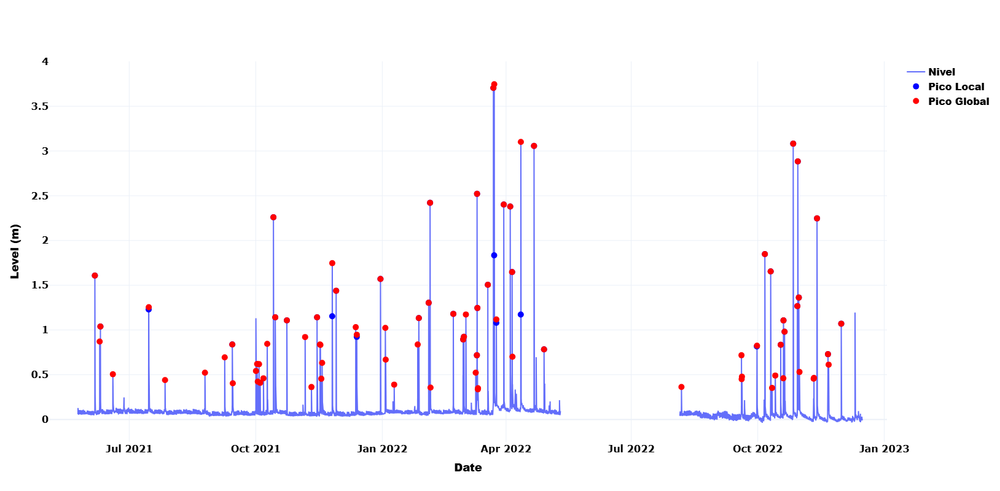

In [48]:
df_nivel['fecha'] = pd.to_datetime(df_nivel['fecha'])
if 'local_fecha' in df_picos.columns:
    df_picos['local_fecha'] = pd.to_datetime(df_picos['local_fecha'], errors='coerce')
if 'global_fecha' in df_picos.columns:
    df_picos['global_fecha'] = pd.to_datetime(df_picos['global_fecha'], errors='coerce')

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=df_nivel['fecha'],
    y=df_nivel['nivel'],
    mode='lines',
    name='Nivel'
))

if 'local_fecha' in df_picos.columns:
    df_local = df_picos.dropna(subset=['local_fecha'])
    df_local_merge = pd.merge(df_local, df_nivel, left_on='local_fecha', right_on='fecha', how='left')
    fig.add_trace(go.Scatter(
        x=df_local_merge['local_fecha'],
        y=df_local_merge['nivel'],
        mode='markers',
        name='Pico Local',
        marker=dict(color='blue', size=10)
    ))

if 'global_fecha' in df_picos.columns:
    df_global = df_picos.dropna(subset=['global_fecha'])
    df_global_merge = pd.merge(df_global, df_nivel, left_on='global_fecha', right_on='fecha', how='left')
    fig.add_trace(go.Scatter(
        x=df_global_merge['global_fecha'],
        y=df_global_merge['nivel'],
        mode='markers',
        name='Pico Global',
        marker=dict(color='red', size=10)
    ))

fig.update_layout(
    
    xaxis=dict(
        title=dict(text="Date", font=dict(size=18, color="black", family="Arial Black")),
        tickfont=dict(size=16, color="black",weight="bold")
    ),
    yaxis=dict(
        title=dict(text="Level (m)", font=dict(size=18, color="black", family="Arial Black")),
        tickfont=dict(size=16, color="black",weight="bold")
    ),
    legend=dict(font=dict(size=16, color="black", family="Arial Black")),
    hovermode="x",
    template="plotly_white",
    width=1600,
    height=800
)

fig.show()
